In [1]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image
import imageio
from tqdm import tqdm
import os

Use the same grid as in Astar problem. Assume there is no graph available. Use RRT/ RRT* to sample paths, build a graph and find the shortest path

Make a gif of the path evolution




In [2]:
# write the Euclidean function that takes in the
# node x, y and compute the distance
def euclidean(node1, node2):
    x1, y1 = node1
    x2, y2 = node2
    return np.sqrt((x1-x2)**2+(y1-y2)**2)

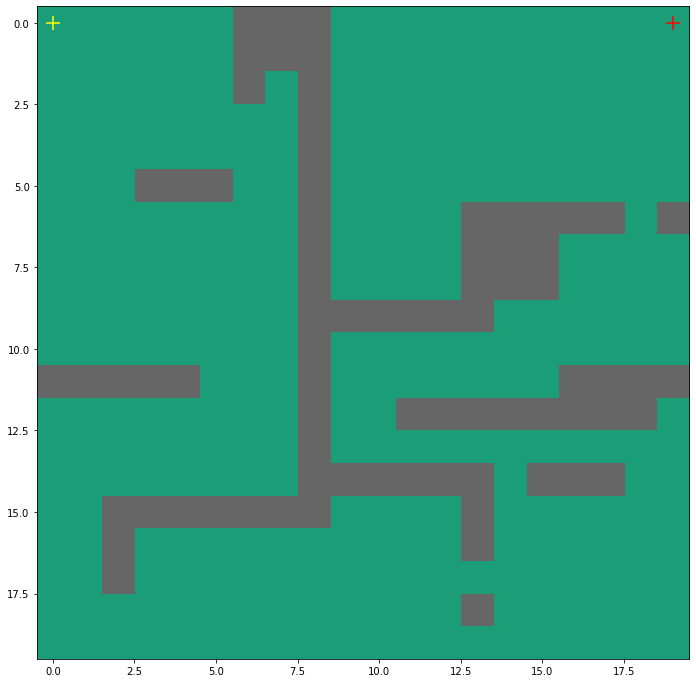

In [3]:
# use np.load to load a grid of 1s and 0s
# 1 - occupied 0- free
grid = np.load("data/astar_grid.npy")
# print(grid)
# you can define your own start/ end
start = (0, 0)
goal = (0, 19)

# visualize the start/ end and the robot's environment
fig, ax = plt.subplots(figsize=(12,12))
ax.imshow(grid, cmap=plt.cm.Dark2)
ax.scatter(start[1],start[0], marker = "+", color = "yellow", s = 200)
ax.scatter(goal[1],goal[0], marker = "+", color = "red", s = 200)
plt.show()

## RRT

In [4]:
class TreeNode:
    def __init__(self,x,y, parent=None):
        self.x = x
        self.y = y
        self.parent = parent
        self.children = []
    def add_child(self, node):
        self.children.append(node)
        node.parent = self


In [5]:
# Helper function to visualize the tree
def plot_tree(root, plt):
    q = []
    q.append((root, None)) # Root and parent
    while (len(q)):
        node, parent = q.pop(0)
        plt.scatter(node.x,node.y, c="b")
        if parent is not None:
            plt.plot([parent.x,node.x],[parent.y,node.y], c="b")
        for child in node.children:
            q.append((child,node))


In [6]:
os.makedirs("./gif_content", exist_ok=True)

start_node = TreeNode(start[1],start[0])
goal_node = TreeNode(goal[1],goal[0])

nodes = []
nodes.append(start_node)
node_exists = np.zeros([20,20])

node_exists[start_node.y, start_node.x] = 1

RESOLUTION_SCALE = 4

def get_new_node():

    x_rand = np.random.randint(grid.shape[1])
    y_rand = np.random.randint(grid.shape[0])

    dest = TreeNode(x_rand,y_rand)
    candidate_nodes = sorted([ (euclidean((node.x,node.y), (x_rand,y_rand)),node) for node in nodes], key=lambda x: x[0])

    for d, node in candidate_nodes[:5]:
        x = node.x
        y = node.y
        if euclidean((dest.x,dest.y), (x,y)) > 4: # Limiting distance from src to random point
            break 
        
        parent = node
        direction = [dest.x-node.x,dest.y-node.y]
        max_change = max(abs(direction[0]),abs(direction[1]))
        if not (max_change > 0): # Let it move some distance
            break
        direction[0] /= (RESOLUTION_SCALE * max_change) # Multiplying with a number to improve the resolution
        direction[1] /= (RESOLUTION_SCALE * max_change)
        
        # Simulate drawing a line to find collision
        for _ in range(round(RESOLUTION_SCALE*max_change)):
            if grid[round(y+direction[1]),round(x+direction[0])] > 0:
                break
            x+=direction[0]
            y+=direction[1]
        
        if node_exists[round(y)][round(x)] == 1: # Avoid adding same node again and again
            continue
        node_exists[round(y),round(x)] = 1
        
        if node.x == round(x) and node.y == round(y):
            continue
        new_node = TreeNode(round(x),round(y))
        parent.add_child(new_node)
        return new_node
    return None

In [7]:
def get_path(child):
    if child is None:
        return []
    return get_path(child.parent) + [[child.x, child.y]]

  8%|▊         | 1544/20000 [02:41<32:15,  9.53it/s]  


Reached Goal!
# nodes 264
Done!


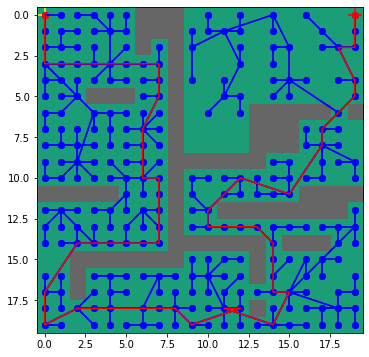

In [8]:
filenames = []

plt.subplots(figsize=(6,6))
plt.imshow(grid, cmap="Dark2")
plt.scatter(start[1],start[0], marker = "+", color = "yellow", s = 200)
plt.scatter(goal[1],goal[0], marker = "+", color = "red", s = 200)

for i in tqdm(range(20_000)):
    
    new_node = get_new_node()

    if new_node is not None:
        nodes.append(new_node)

        plt.scatter(new_node.x,new_node.y, c="b")
        plt.plot([new_node.x,new_node.parent.x],[new_node.y,new_node.parent.y],c="b")

    else:
        continue
    if euclidean( (new_node.x, new_node.y), (goal_node.x, goal_node.y) )<=1: # If the node is within 1 unit radius of goal terminate the algorithm
        new_node.add_child(goal_node)

        nodes.append(goal_node)
        print("Reached Goal!")
        break
    n_nodes = len(nodes)
#     if n_nodes % 2 == 0:
    plt.savefig(f"./gif_figs/{n_nodes}.png")
    filenames.append(f"./gif_figs/{n_nodes}.png")



print("# nodes", len(nodes))


def get_path(child):
    if child is None:
        return []
    return get_path(child.parent) + [[child.x, child.y]]
plot_tree(start_node, plt)

path = np.array(get_path(goal_node))

print("Done!")


plt.scatter(start[1], start[0], c="r")
plt.scatter(goal[1], goal[0], c="r")
plt.plot(path[:,0],path[:,1],c="r")
plt.savefig("./gif_content/done.png")
for _ in range(10): # Show the last image 10 times
    filenames.append("./gif_content/done.png")

plt.show()

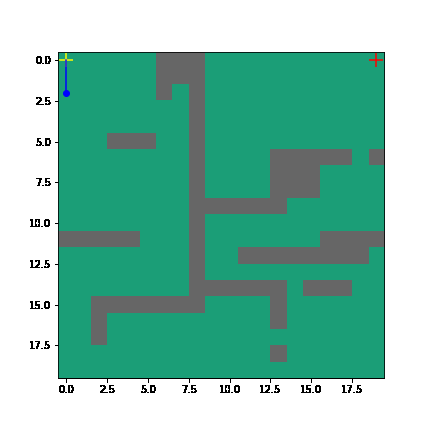

In [9]:
# Ref: https://towardsdatascience.com/basics-of-gifs-with-pythons-matplotlib-54dd544b6f30
import imageio
with imageio.get_writer('rrt.gif', mode='I') as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)
Image('rrt.gif')